# **Color Correction**

## Library Uses

In [91]:
import sys
import os
sys.path.append(os.path.abspath('..'))

from scripts.ColorCorrectionML import ColorCorrectionML
import cv2
import rawpy

Ukuran citra setelah ekstraksi RAW: 3468x4624 (lebar x tinggi)


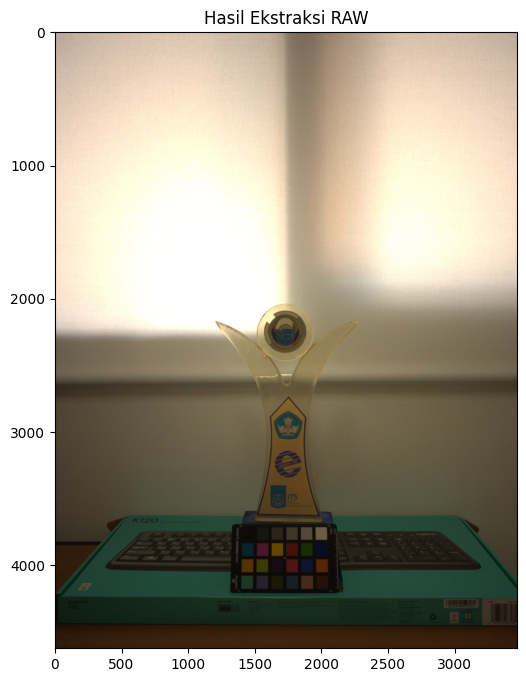

In [94]:
import matplotlib.pyplot as plt

# 1. Ekstraksi citra RAW menggunakan rawpy
with rawpy.imread(r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HPmu CC.dng') as raw:
    # Terapkan argumen postprocess() custom Anda di sini 
    # (misal: user_wb, penyesuaian gamma, dan black level offset)
    #rgb_image = raw.postprocess(use_camera_wb=True)
    rgb_image = raw.postprocess(
        use_camera_wb=False, 
        #exp_shift=2.0, # Silakan bereksperimen dengan angka ini sampai tingkat kecerahan pas
        #no_auto_bright=True, # Matikan auto brightness untuk kontrol penuh
    )
    #rgb_img = raw.postprocess()

# 2. Konversi format RGB (dari rawpy) ke BGR (untuk ColorCorrectionML)
bgr_img = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2BGR)
img_shape = bgr_img.shape
print(f"Ukuran citra setelah ekstraksi RAW: {img_shape[1]}x{img_shape[0]} (lebar x tinggi)")

plt.figure(figsize=(10, 8))
# Convert sementara ke RGB hanya untuk ditampilkan oleh matplotlib
plt.imshow(cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)) 
plt.title('Hasil Ekstraksi RAW')

# Menampilkan sumbu X dan Y sangat penting di sini untuk memastikan 
# resolusi citra sudah berada di angka ribuan (bukan 190x250 lagi)
plt.axis('on') 
plt.show()

# 3. (Opsional) Jika citra RAW terlalu besar (misal 12MP atau 4000x3000) 
# dan membuat proses regresi sangat lambat, Anda bisa me-resize-nya secara proporsional.
# bgr_img = cv2.resize(bgr_img, (0,0), fx=0.3, fy=0.3, interpolation=cv2.INTER_AREA)




Initial mean DeltaE:  33.5974434803
Number of components:  10
Model fit score:  0.9898606365679524
Final mean DeltaE:  2.15837414302


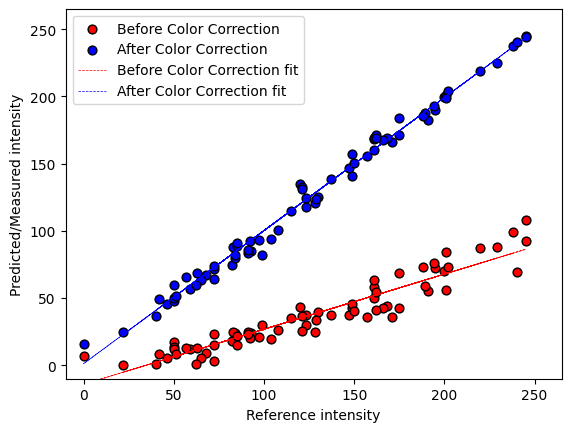

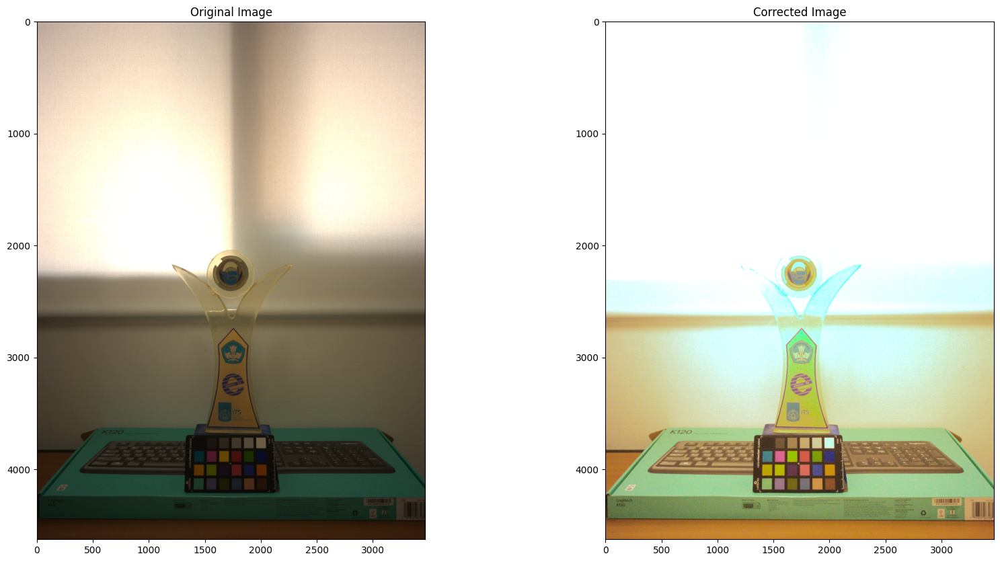

In [97]:
#img = cv2.imread(r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HPmu CC.dng')

cc = ColorCorrectionML(bgr_img, chart='Classic', illuminant='D50')

method = 'pls' # 'linear', 'lstsq', 'pls' 
# for linear regression, least square regression, and partial least square regression respectively
show = True

kwargs = {
    'method': method,
    'degree': 3, # degree of polynomial, from lib 3
    'interactions_only': False, # only interactions terms,
    'ncomp': 10, # number of components for PLS only
    'max_iter': 5000, # max iterations for PLS only
    'white_balance_mtd': 0 # 0: no white balance, 1: learningBasedWB, 2: simpleWB, 3: grayWorldWB,
    }

M, patch_size = cc.compute_correction(
    show=show,
    **kwargs
)
    
# resize img by 2
#img = cv2.resize(img, (0,0), fx=0.3, fy=0.3, interpolation=cv2.INTER_AREA)

img_corr = cc.correct_img(bgr_img, show=True)
#img_corr = cc.Parallel_correct_img(img, chunks_=50000, show=True)

## DARI GEMINI

In [101]:
import sys
import os
import cv2
import rawpy
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures

# Pastikan path ini mengarah ke direktori yang benar sesuai struktur folder Anda
sys.path.append(os.path.abspath('..'))
from scripts.ColorCorrectionML import ColorCorrectionML

In [102]:
def proses_kalibrasi_hp(file_path, nama_perangkat, exp_shift=2.0):
    print(f"Memproses {nama_perangkat}...")
    
    # 1. Ekstraksi citra RAW menggunakan rawpy
    with rawpy.imread(file_path) as raw:
        kwargs_raw = {'use_camera_wb': False, 'exp_shift': exp_shift}
        rgb_image = raw.postprocess(**kwargs_raw)

    # 2. Konversi format RGB ke BGR
    bgr_img = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2BGR)

    # 3. Inisialisasi Class ColorCorrectionML
    cc = ColorCorrectionML(bgr_img, chart='Classic', illuminant='D50')
    
    # Ekstrak nilai warna SEBELUM dikoreksi
    src_awal, _, _ = cc.extract_color_chart()
    mean_deltaE_awal = ColorCorrectionML.DeltaE(src_awal, cc.reference)[2]

    # 4. Jalankan perhitungan model regresi (PLS)
    kwargs_ml = {
        'method': 'pls',
        'degree': 3, 
        'interactions_only': False, 
        'ncomp': 10, 
        'max_iter': 5000, 
        'white_balance_mtd': 0 
    }
    model, patch_size = cc.compute_correction(show=False, **kwargs_ml)

    # 5. Nilai Prediksi Akhir (SETELAH dikoreksi)
    src_transformed = src_awal.copy()
    if kwargs_ml['degree'] > 1:
        src_transformed = PolynomialFeatures(degree=kwargs_ml['degree'], interaction_only=kwargs_ml['interactions_only']).fit_transform(src_transformed)
    
    src_prediksi = model.predict(src_transformed)
    mean_deltaE_akhir = ColorCorrectionML.DeltaE(src_prediksi, cc.reference)[2]

    # Terapkan koreksi ke seluruh gambar (hanya untuk plot visual)
    img_koreksi_bgr = cc.correct_img(bgr_img, show=False)

    return {
        'nama': nama_perangkat,
        'img_raw_rgb': rgb_image,
        'img_koreksi_bgr': img_koreksi_bgr,
        'patch_awal': src_awal,
        'patch_akhir': src_prediksi,
        'delta_awal': mean_deltaE_awal,
        'delta_akhir': mean_deltaE_akhir
    }

In [103]:
path_samsung = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HPmu CC.dng'
path_iphone = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HP Masjek CC.dng' # Sesuaikan dengan file iPhone Anda

print("Path file berhasil diatur.")

Path file berhasil diatur.


Memproses Samsung A52s...
Initial mean DeltaE:  24.9625028368
Number of components:  10

[Samsung A52s]
Delta-E Sebelum : 24.9625
Delta-E Sesudah : 2.0890


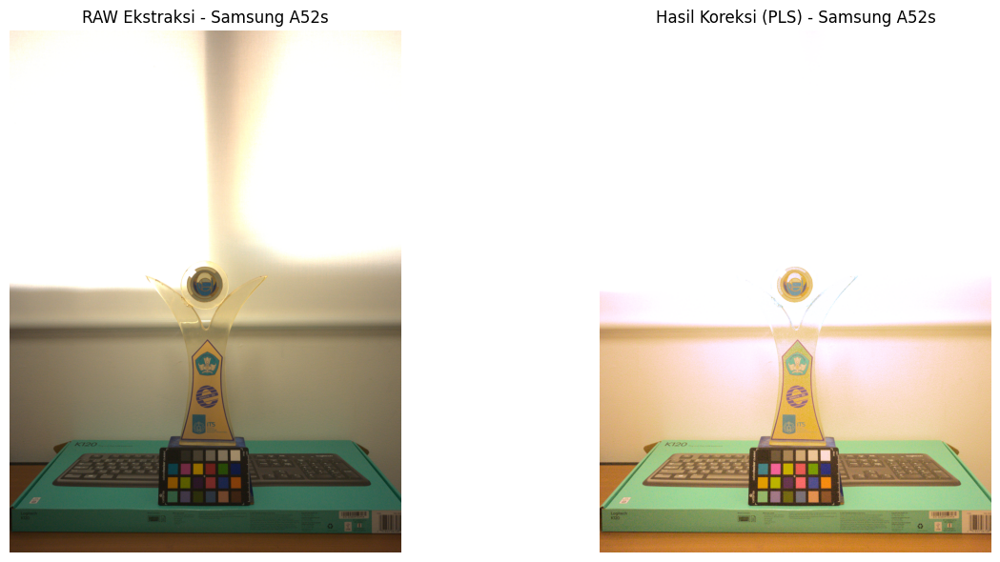

In [104]:
# Eksekusi (Atur user_black jika terjadi green cast pada raw)
data_samsung = proses_kalibrasi_hp(path_samsung, 'Samsung A52s', exp_shift=2.0)

print(f"\n[{data_samsung['nama']}]")
print(f"Delta-E Sebelum : {data_samsung['delta_awal']:.4f}")
print(f"Delta-E Sesudah : {data_samsung['delta_akhir']:.4f}")

# Plotting Hasil Samsung
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(data_samsung['img_raw_rgb'])
axes[0].set_title(f"RAW Ekstraksi - {data_samsung['nama']}")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(data_samsung['img_koreksi_bgr'], cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Hasil Koreksi (PLS) - {data_samsung['nama']}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

Memproses iPhone 11...
Initial mean DeltaE:  6.09884840612
Number of components:  10

[iPhone 11]
Delta-E Sebelum : 6.0988
Delta-E Sesudah : 1.8253


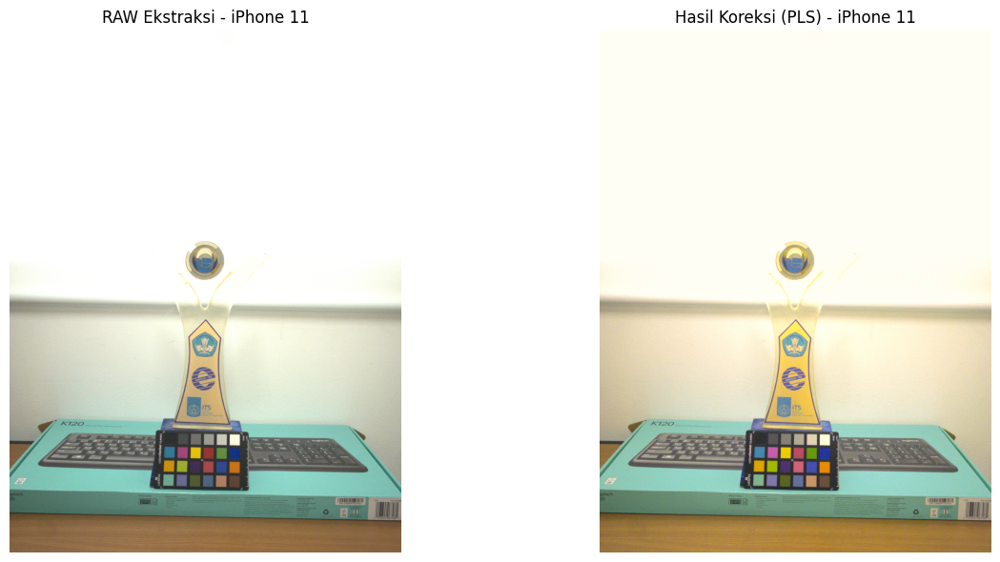

In [106]:
# Eksekusi (Atur user_black jika terjadi green cast pada raw)
data_iphone = proses_kalibrasi_hp(path_iphone, 'iPhone 11', exp_shift=2.0)

print(f"\n[{data_iphone['nama']}]")
print(f"Delta-E Sebelum : {data_iphone['delta_awal']:.4f}")
print(f"Delta-E Sesudah : {data_iphone['delta_akhir']:.4f}")

# Plotting Hasil iPhone
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(data_iphone['img_raw_rgb'])
axes[0].set_title(f"RAW Ekstraksi - {data_iphone['nama']}")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(data_iphone['img_koreksi_bgr'], cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Hasil Koreksi (PLS) - {data_iphone['nama']}")
axes[1].axis('off')

plt.tight_layout()
plt.show()

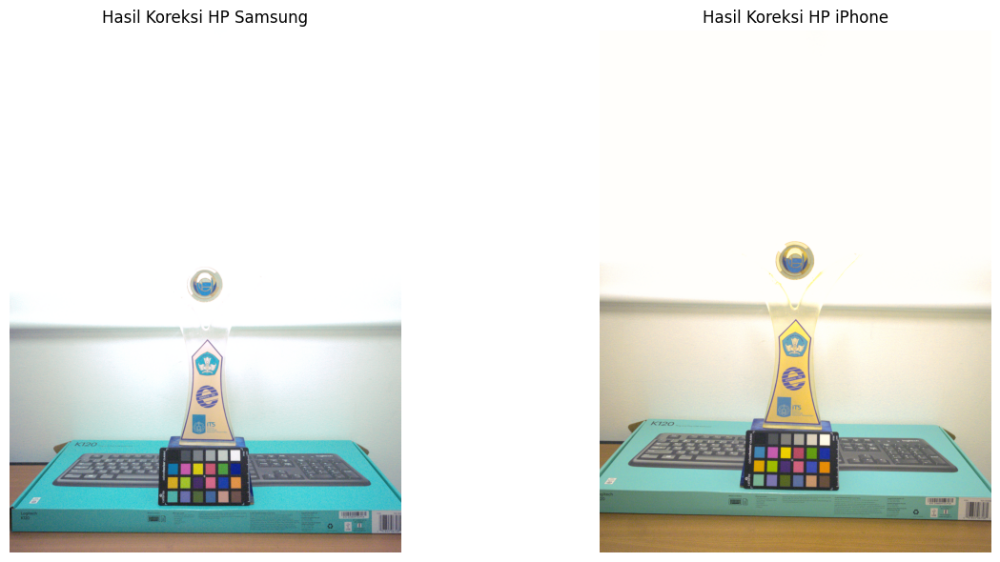

In [70]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(cv2.cvtColor(data_samsung['img_koreksi_bgr'], cv2.COLOR_BGR2RGB))
axes[0].set_title(f"Hasil Koreksi HP Samsung")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(data_iphone['img_koreksi_bgr'], cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Hasil Koreksi HP iPhone")
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [107]:
# Menghitung Delta E antara kotak warna Samsung dan iPhone (setelah koreksi)
konsistensi_cross_device = ColorCorrectionML.DeltaE(data_samsung['patch_akhir'], data_iphone['patch_akhir'])[2]

print('='*60)
print('KONSISTENSI CROSS-DEVICE (Samsung vs iPhone)')
print('='*60)
print(f"Mean Delta E antara kedua hasil koreksi: {konsistensi_cross_device:.4f}\n")

if konsistensi_cross_device < 5.0:
    print("KESIMPULAN: Algoritma sukses menyeragamkan warna dari kedua perangkat! (Konsisten)")
else:
    print("KESIMPULAN: Masih terdapat perbedaan warna yang signifikan antar perangkat.")

KONSISTENSI CROSS-DEVICE (Samsung vs iPhone)
Mean Delta E antara kedua hasil koreksi: 1.0041

KESIMPULAN: Algoritma sukses menyeragamkan warna dari kedua perangkat! (Konsisten)


EVALUASI KHUSUS WARNA KONJUNGTIVA (MERAH & PINK)
Mean Delta E Cross-Device (Hanya patch relevan): 0.7503



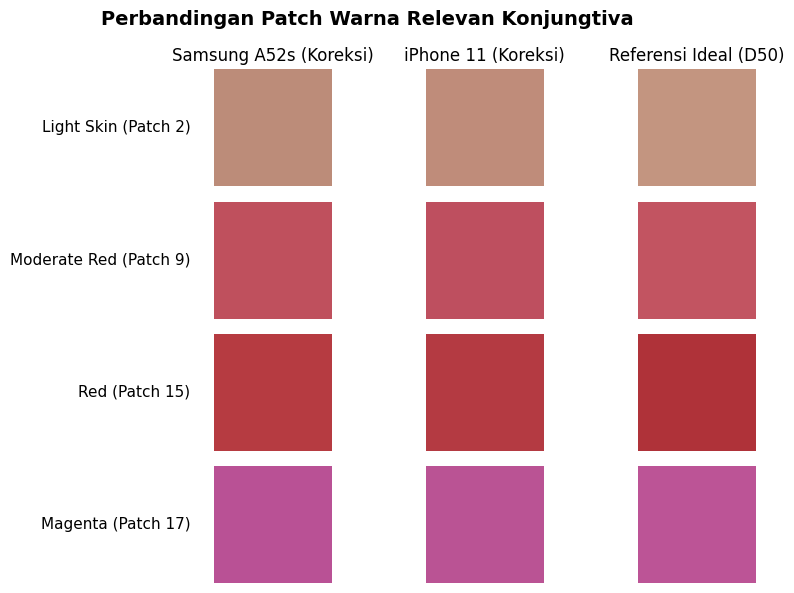

In [108]:
from scripts.reference_values import referenceColor

# Ambil nilai referensi asli D50
ref_d50 = referenceColor().getReference('Classic', 'D50')

# Indeks array di Python dimulai dari 0.
# Patch 2 (Light Skin), Patch 9 (Mod. Red), Patch 15 (Red), Patch 17 (Magenta)
indeks_target = [1, 8, 14, 16]
nama_patch = ["Light Skin (Patch 2)", "Moderate Red (Patch 9)", "Red (Patch 15)", "Magenta (Patch 17)"]

# Ekstrak hanya 4 patch tersebut dari hasil prediksi model
samsung_target = data_samsung['patch_akhir'][indeks_target]
iphone_target = data_iphone['patch_akhir'][indeks_target]
ref_target = ref_d50[indeks_target]

# Hitung Delta E spesifik pada area "konjungtiva" antar perangkat
delta_e_target = ColorCorrectionML.DeltaE(samsung_target, iphone_target)[2]

print("="*70)
print("EVALUASI KHUSUS WARNA KONJUNGTIVA (MERAH & PINK)")
print("="*70)
print(f"Mean Delta E Cross-Device (Hanya patch relevan): {delta_e_target:.4f}\n")

# Visualisasi perbandingan warna (Solid Color Block)
fig, axes = plt.subplots(len(indeks_target), 3, figsize=(10, 6))
fig.suptitle("Perbandingan Patch Warna Relevan Konjungtiva", fontsize=14, fontweight='bold')

axes[0, 0].set_title("Samsung A52s (Koreksi)")
axes[0, 1].set_title("iPhone 11 (Koreksi)")
axes[0, 2].set_title("Referensi Ideal (D50)")

for i in range(len(indeks_target)):
    # Normalisasi RGB dari 0-255 ke rentang 0.0 - 1.0 (Syarat matplotlib)
    # np.clip digunakan untuk mencegah error jika model memprediksi sedikit di atas 255
    color_samsung = np.clip(samsung_target[i] / 255.0, 0, 1)
    color_iphone = np.clip(iphone_target[i] / 255.0, 0, 1)
    color_ref = np.clip(ref_target[i] / 255.0, 0, 1)

    # Plot blok warna Samsung
    axes[i, 0].imshow([[color_samsung]])
    axes[i, 0].axis('off')
    # Tambahkan label nama patch di sisi kiri
    axes[i, 0].text(-0.2, 0.5, nama_patch[i], va='center', ha='right', 
                    fontsize=11, transform=axes[i, 0].transAxes)

    # Plot blok warna iPhone
    axes[i, 1].imshow([[color_iphone]])
    axes[i, 1].axis('off')

    # Plot blok warna Referensi
    axes[i, 2].imshow([[color_ref]])
    axes[i, 2].axis('off')

plt.tight_layout()
plt.subplots_adjust(left=0.25) # Memberi ruang agar teks label tidak terpotong
plt.show()

## GRAY CARD ONLY

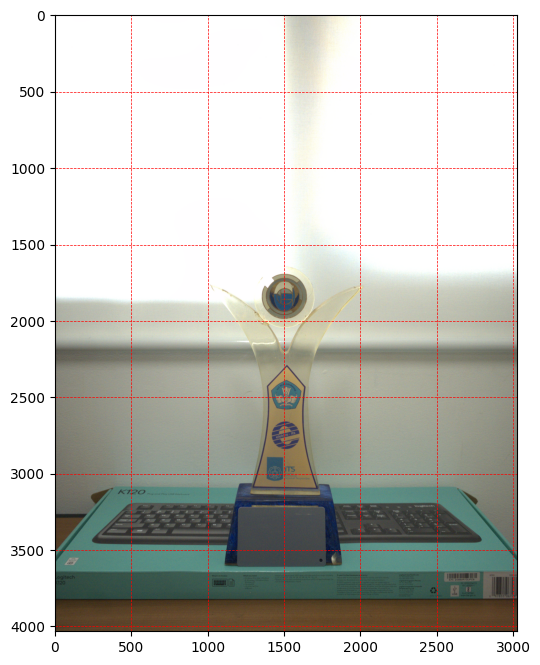

In [133]:
# Tentukan path ke gambar Gray Card Fisik
path_gray_card = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HP Masjek Gray.dng'

# 1. Ekstrak gambar Gray Card (Gunakan parameter yang SAMA dengan saat mengekstrak ColorChecker)
with rawpy.imread(path_gray_card) as raw:
    rgb_gray_img = raw.postprocess(
        use_camera_wb=False, # Matikan WB bawaan kamera (gambar akan terlihat sangat hijau)
        #gamma=(1, 1),        # Matikan Gamma (pertahankan di ruang linear murni 1.0)
        #no_auto_bright=True, # Jangan biarkan rawpy mencerahkan otomatis
        exp_shift=1.0        # Kembalikan ke 1.0 agar tidak overexposed
    )
# 2. Tampilkan gambar dalam ukuran besar agar kita bisa membaca koordinat X dan Y nya
plt.figure(figsize=(10, 8))
plt.imshow(rgb_gray_img)
#plt.title("Tentukan Koordinat ROI Gray Card")
plt.axis('on')
plt.grid(color='red', linestyle='--', linewidth=0.5) # Tambahkan grid agar mudah dibaca
plt.show()

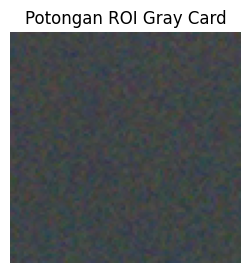


[ANALISIS] Rata-rata ROI -> R: 63.75, G: 69.26, B: 71.12
[HASIL] Calculated Gains -> R: 1.086, G: 1.000, B: 0.974

PERBANDINGAN METODE
1. Delta E Asli (Belum Dikoreksi)          : 24.9625
3. Delta E Metode Regresi PLS (ML)         : 2.0890


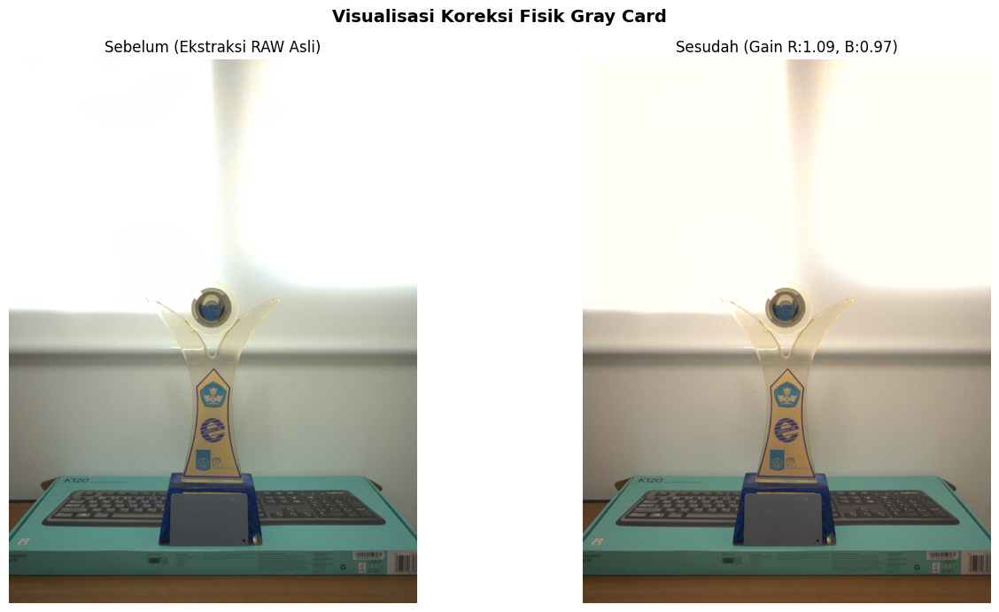

In [134]:
def apply_gamma(image_linear, gamma=2.222):

    # Gunakan np.clip untuk memastikan tidak ada nilai negatif atau > 1.0 sebelum dipangkatkan
    img_norm = np.clip(image_linear.astype(np.float32) / 255.0, 0, 1)
    img_gamma = np.power(img_norm, 1.0 / gamma)
    img_out = (img_gamma * 255).astype(np.uint8)
    return img_out

# =================================================================
# MASUKKAN KOORDINAT GRAY CARD BERDASARKAN GAMBAR DI ATAS
# =================================================================
# Ganti angka-angka ini sesuai dengan area abu-abu di gambar Anda!
y_start, y_end = 3500, 3600 
x_start, x_end = 1500, 1600 

# Ambil area ROI
roi_gray = rgb_gray_img[y_start:y_end, x_start:x_end]

# Tampilkan ROI untuk memastikan potongannya benar (hanya warna abu-abu)
plt.figure(figsize=(3,3))
plt.imshow(roi_gray)
plt.title("Potongan ROI Gray Card")
plt.axis('off')
plt.show()

# =================================================================
# MENGHITUNG GAIN VON KRIES
# =================================================================
# Karena rgb_gray_img formatnya RGB, kita hitung rata-rata: R=0, G=1, B=2
avg_r = np.mean(roi_gray[:,:,0])
avg_g = np.mean(roi_gray[:,:,1])
avg_b = np.mean(roi_gray[:,:,2])

print(f"\n[ANALISIS] Rata-rata ROI -> R: {avg_r:.2f}, G: {avg_g:.2f}, B: {avg_b:.2f}")

# Hitung Gain (Patokan = Green)
gain_r = avg_g / avg_r
gain_b = avg_g / avg_b
gain_g = 1.0 

print(f"[HASIL] Calculated Gains -> R: {gain_r:.3f}, G: {gain_g:.3f}, B: {gain_b:.3f}")

# =================================================================
# UJI FAIRNESS: Terapkan gain ke data ColorChecker (Samsung)
# =================================================================
# Kita ambil patch awal dari Samsung (format BGR). Indeks: B=0, G=1, R=2
image_float = rgb_gray_img.astype(np.float32)
image_float[:,:,0] *= gain_r # Red
image_float[:,:,1] *= gain_g # Green
image_float[:,:,2] *= gain_b # Blue
rgb_wb_linear = np.clip(image_float, 0, 255).astype(np.uint8)
rgb_final_corrected = apply_gamma(rgb_wb_linear, gamma=2.222)

# Hitung Delta E dari hasil Gray Card ke Referensi D50
from scripts.reference_values import referenceColor
ref_d50 = referenceColor().getReference('Classic', 'D50')
#deltaE_graycard = ColorCorrectionML.DeltaE(rgb_final_corrected, ref_d50)[2]

print("\n" + "="*60)
print("PERBANDINGAN METODE")
print("="*60)
print(f"1. Delta E Asli (Belum Dikoreksi)          : {data_samsung['delta_awal']:.4f}")
#print(f"2. Delta E Metode Fisik Gray Card (Linear) : {deltaE_graycard:.4f}")
print(f"3. Delta E Metode Regresi PLS (ML)         : {data_samsung['delta_akhir']:.4f}")

# Clip ke batas 0-255 dan ubah kembali ke uint8
rgb_gray_img_corrected = np.clip(image_float, 0, 255).astype(np.uint8)

# Tampilkan Perbandingan Sebelum dan Sesudah
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle("Visualisasi Koreksi Fisik Gray Card", fontsize=14, fontweight='bold')

axes[0].imshow(rgb_gray_img)
axes[0].set_title("Sebelum (Ekstraksi RAW Asli)")
axes[0].axis('off')

axes[1].imshow(rgb_gray_img_corrected)
axes[1].set_title(f"Sesudah (Gain R:{gain_r:.2f}, B:{gain_b:.2f})")
axes[1].axis('off')

plt.tight_layout()
plt.show()


## Evaluasi - Dari Gemini

In [150]:
import numpy as np
import cv2
import rawpy
import sys
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures

# Pastikan path ini sesuai dengan struktur direktori Anda
sys.path.append(os.path.abspath('..'))
from scripts.reference_values import referenceColor
from scripts.ColorCorrectionML import ColorCorrectionML

In [186]:
def apply_gamma(image_linear, gamma=2.222):
    """
    Fungsi bantuan untuk mengubah ruang Linear ke ruang sRGB (Gamma)
    sebelum dihitung Delta E-nya.
    """
    img_norm = np.clip(image_linear.astype(np.float32) / 255.0, 0, 1)
    img_gamma = np.power(img_norm, 1.0 / gamma)
    return (img_gamma * 255).astype(np.uint8)

INDEKS_KONJUNGTIVA = [1, 8, 14, 16] 
NAMA_PATCH = ["Light Skin", "Mod. Red", "Red", "Magenta"]

In [228]:
def evaluasi_komparatif_hp(path_cc, path_gray, roi_gray_coords, nama_hp):
    """
    Fungsi untuk mengevaluasi kinerja metode ML vs Gray Card pada satu HP.
    
    Parameter:
    - path_cc: Lokasi gambar ColorChecker (DNG)
    - path_gray: Lokasi gambar Gray Card (DNG)
    - roi_gray_coords: Tuple koordinat (y_start, y_end, x_start, x_end)
    - nama_hp: String nama perangkat (untuk penamaan saat diprint)
    """
    y_start, y_end, x_start, x_end = roi_gray_coords
    
    print("="*60)
    print(f"MEMULAI EVALUASI: {nama_hp.upper()}")
    print("="*60)

    # =================================================================
    # PROSES 1: MACHINE LEARNING (GOLDEN STANDARD)
    # =================================================================
    print("[PROSES 1] Menjalankan Machine Learning pada ColorChecker...")
    with rawpy.imread(path_cc) as raw:
        rgb_cc_standar = raw.postprocess(use_camera_wb=True, exp_shift=2.0)

    bgr_cc_standar = cv2.cvtColor(rgb_cc_standar, cv2.COLOR_RGB2BGR)
    cc_ml = ColorCorrectionML(bgr_cc_standar, chart='Classic', illuminant='D50')

    # Ekstrak & Latih Model
    src_awal_ml, _, _ = cc_ml.extract_color_chart()
    model_pls, _ = cc_ml.compute_correction(
        show=False, method='pls', degree=3, 
        interactions_only=False, ncomp=10, max_iter=5000, white_balance_mtd=0
    )

    # Prediksi warna akhir
    src_transformed = PolynomialFeatures(degree=3, interaction_only=False).fit_transform(src_awal_ml)
    src_akhir_ml = np.clip(model_pls.predict(src_transformed), 0, 255)
    
    # Ambil khusus patch warna Konjungtiva & Hitung Delta E vs D50
    patch_ml_konj = src_akhir_ml[INDEKS_KONJUNGTIVA]
    ref_d50 = cc_ml.reference[INDEKS_KONJUNGTIVA]
    deltaE_ml = ColorCorrectionML.DeltaE(patch_ml_konj, ref_d50)[2]

    bgr_ml_corrected = cc_ml.correct_img(bgr_cc_standar, show=False)
    rgb_ml_corrected = cv2.cvtColor(bgr_ml_corrected, cv2.COLOR_BGR2RGB)

    print(f"-> Mean Delta E (ML - Golden Standard) = {deltaE_ml:.4f}")

    # =================================================================
    # PROSES 2: VON KRIES GRAY CARD
    # =================================================================
    print("\n[PROSES 2] Menjalankan Metode Fisik Gray Card (Von Kries)...")
    
    # A. Ekstrak Linear Gambar Gray Card untuk Gain
    with rawpy.imread(path_gray) as raw:
        rgb_gray_linear = raw.postprocess(use_camera_wb=False, gamma=(1, 1), no_auto_bright=True, exp_shift=2.0)
        #rgb_gray_linear = raw.postprocess(use_camera_wb=False, exp_shift=2.0)
        

    roi_gray = rgb_gray_linear[y_start:y_end, x_start:x_end]
    avg_r = np.mean(roi_gray[:,:,0])
    avg_g = np.mean(roi_gray[:,:,1])
    avg_b = np.mean(roi_gray[:,:,2])

    gain_r = avg_g / avg_r if avg_r != 0 else 1.0
    gain_b = avg_g / avg_b if avg_b != 0 else 1.0
    gain_g = 1.0
    print(f"-> Gain Linear Ditemukan: R={gain_r:.3f}, G={gain_g:.3f}, B={gain_b:.3f}")

    # B. Ekstrak Linear Gambar ColorChecker
    with rawpy.imread(path_cc) as raw:
        # Gunakan exp_shift=2.0 agar kecerahan gambar pas setelah di-gamma
        rgb_cc_linear = raw.postprocess(use_camera_wb=False, gamma=(1, 1), no_auto_bright=True, exp_shift=3.0)
        #rgb_cc_linear = raw.postprocess(use_camera_wb=False, exp_shift=2.0)

    # C. Aplikasikan Gain ke SELURUH Gambar ColorChecker terlebih dahulu
    image_float = rgb_cc_linear.astype(np.float32)
    # rgb_cc_linear menggunakan format RGB
    image_float[:,:,0] *= gain_r # Channel R
    image_float[:,:,1] *= gain_g # Channel G
    image_float[:,:,2] *= gain_b # Channel B

    # D. Terapkan Gamma agar gambar menjadi normal/terang untuk dibaca oleh OpenCV
    rgb_cc_gray_corrected = apply_gamma(image_float)
    bgr_cc_gray_corrected = cv2.cvtColor(rgb_cc_gray_corrected, cv2.COLOR_RGB2BGR)

    # E. Ekstrak kotak warna dari gambar yang SUDAH dikoreksi oleh Gain Gray Card
    cc_gray = ColorCorrectionML(bgr_cc_gray_corrected, chart='Classic', illuminant='D50')
    src_gray_terkoreksi, _, _ = cc_gray.extract_color_chart()

    # Ambil patch konjungtiva yang sudah terkoreksi
    patch_gray_konj = src_gray_terkoreksi.astype(np.float32)[INDEKS_KONJUNGTIVA].copy()

    # Hitung Delta E vs D50
    deltaE_gray = ColorCorrectionML.DeltaE(patch_gray_konj, ref_d50)[2]
    print(f"-> Mean Delta E (Metode Gray Card)   = {deltaE_gray:.4f}")

    # =================================================================
    # KESIMPULAN
    # =================================================================
    print("\n[KESIMPULAN METODE]")
    selisih = abs(deltaE_gray - deltaE_ml)
    print(f"Selisih Akurasi (Gray Card vs Golden Standard): {selisih:.4f} Delta E")
    if deltaE_gray <= deltaE_ml + 2.0:
        print("HASIL: Metode Gray Card Valid dan Setara dengan Golden Standard ML.")
    else:
        print("HASIL: Terdapat perbedaan signifikan dibandingkan Golden Standard.")
        
    fig, axes = plt.subplots(len(INDEKS_KONJUNGTIVA), 3, figsize=(10, 6))
    fig.suptitle(f"Perbandingan Warna Konjungtiva - {nama_hp}", fontsize=14, fontweight='bold')

    axes[0, 0].set_title("Golden Standard (ML)")
    axes[0, 1].set_title("Gray Card (Von Kries)")
    axes[0, 2].set_title("Referensi Ideal (D50)")

    for i in range(len(INDEKS_KONJUNGTIVA)):
        # Normalisasi ke rentang 0-1 untuk matplotlib
        color_ml = np.clip(patch_ml_konj[i] / 255.0, 0, 1)
        color_gray = np.clip(patch_gray_konj[i] / 255.0, 0, 1)
        color_ref = np.clip(ref_d50[i] / 255.0, 0, 1)

        # Plot Hasil ML
        axes[i, 0].imshow([[color_ml]])
        axes[i, 0].axis('off')
        # Tampilkan nama patch di sebelah kiri
        axes[i, 0].text(-0.2, 0.5, NAMA_PATCH[i], va='center', ha='right', fontsize=11, transform=axes[i, 0].transAxes)

        # Plot Hasil Gray Card
        axes[i, 1].imshow([[color_gray]])
        axes[i, 1].axis('off')

        # Plot Referensi D50
        axes[i, 2].imshow([[color_ref]])
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(left=0.25) # Menyesuaikan margin kiri agar teks tidak terpotong
    plt.show()

    print("\n[MENAMPILKAN VISUALISASI GAMBAR KESELURUHAN...]")
    fig_full, axes_full = plt.subplots(1, 2, figsize=(16, 8))
    fig_full.suptitle(f"Perbandingan Gambar Keseluruhan - {nama_hp}", fontsize=16, fontweight='bold')

    axes_full[0].imshow(rgb_ml_corrected)
    axes_full[0].set_title(f"Golden Standard (Koreksi ML - PLS)\nMean \u0394E Konjungtiva: {deltaE_ml:.2f}", fontsize=12)
    axes_full[0].axis('off')

    axes_full[1].imshow(rgb_cc_gray_corrected)
    axes_full[1].set_title(f"Metode Fisik (Gain Gray Card + Gamma)\nMean \u0394E Konjungtiva: {deltaE_gray:.2f}", fontsize=12)
    axes_full[1].axis('off')

    plt.tight_layout()
    plt.show()

    # Mengembalikan patch hasil ML dan Gray Card untuk keperluan evaluasi Cross-Device nanti
    return patch_ml_konj, patch_gray_konj

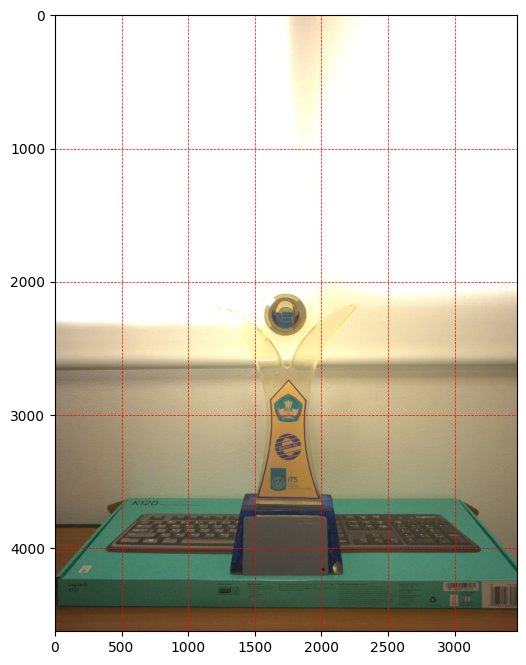

In [204]:
path_cc_1 = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HPmu CC.dng'
path_gray_1 = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HPmu Gray.dng'

with rawpy.imread(path_gray_1) as raw:
        gray_img_1 = raw.postprocess(use_camera_wb=False, exp_shift=3.0)

plt.figure(figsize=(10, 8))
plt.imshow(gray_img_1)
#plt.title("Tentukan Koordinat ROI Gray Card")
plt.axis('on')
plt.grid(color='red', linestyle='--', linewidth=0.5) # Tambahkan grid agar mudah dibaca
plt.show()

MEMULAI EVALUASI: SAMSUNG A52S
[PROSES 1] Menjalankan Machine Learning pada ColorChecker...
Initial mean DeltaE:  25.1603873601
Number of components:  10
-> Mean Delta E (ML - Golden Standard) = 2.0388

[PROSES 2] Menjalankan Metode Fisik Gray Card (Von Kries)...
-> Gain Linear Ditemukan: R=0.886, G=1.000, B=1.217
-> Mean Delta E (Metode Gray Card)   = 12.9340

[KESIMPULAN METODE]
Selisih Akurasi (Gray Card vs Golden Standard): 10.8953 Delta E
HASIL: Terdapat perbedaan signifikan dibandingkan Golden Standard.


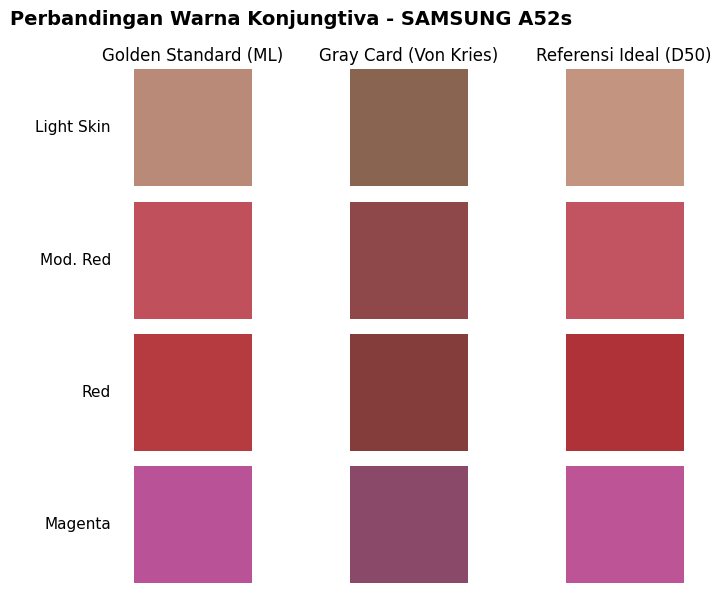


[MENAMPILKAN VISUALISASI GAMBAR KESELURUHAN...]


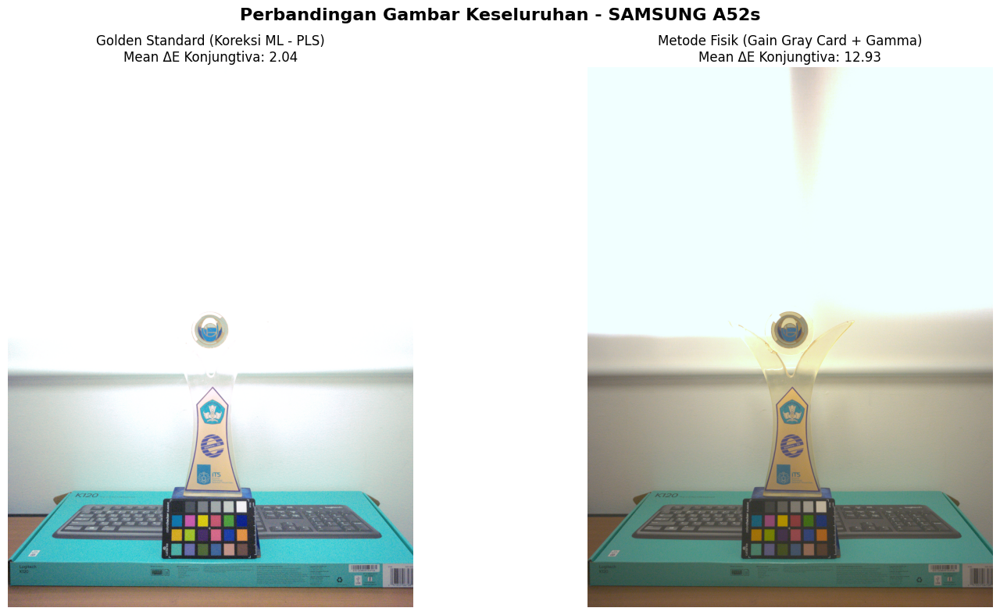

In [229]:
# Format Koordinat: (y_start, y_end, x_start, x_end)
roi_1 = (4000, 4100, 1500, 2000)

# Jalankan Fungsi
patch_cc_1, patch_gray_1 = evaluasi_komparatif_hp(
    path_cc_1, 
    path_gray_1, 
    roi_1, 
    "SAMSUNG A52s"
)

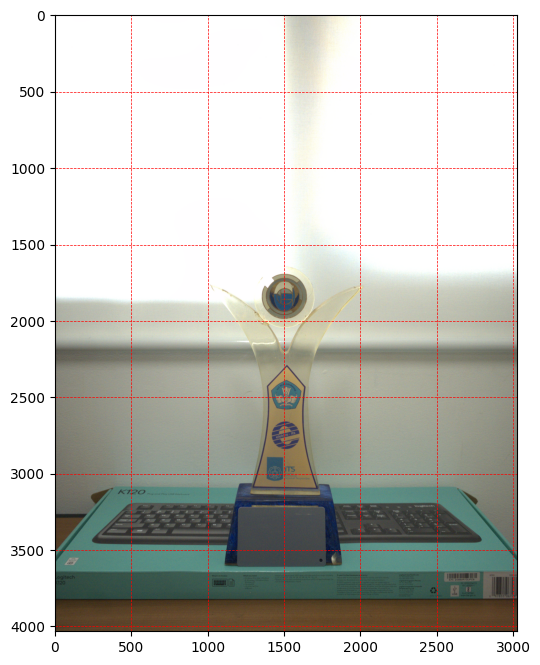

In [219]:
path_cc_2 = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HP Masjek CC.dng'
path_gray_2 = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\HP Masjek Gray.dng'

with rawpy.imread(path_gray_2) as raw:
        gray_img_2 = raw.postprocess(use_camera_wb=False, exp_shift=1.0)

plt.figure(figsize=(10, 8))
plt.imshow(gray_img_2)
#plt.title("Tentukan Koordinat ROI Gray Card")
plt.axis('on')
plt.grid(color='red', linestyle='--', linewidth=0.5) # Tambahkan grid agar mudah dibaca
plt.show()

MEMULAI EVALUASI: IPHONE 11
[PROSES 1] Menjalankan Machine Learning pada ColorChecker...
Initial mean DeltaE:  5.85011936116
Number of components:  10
-> Mean Delta E (ML - Golden Standard) = 1.7770

[PROSES 2] Menjalankan Metode Fisik Gray Card (Von Kries)...
-> Gain Linear Ditemukan: R=1.089, G=1.000, B=0.938
-> Mean Delta E (Metode Gray Card)   = 8.4090

[KESIMPULAN METODE]
Selisih Akurasi (Gray Card vs Golden Standard): 6.6320 Delta E
HASIL: Terdapat perbedaan signifikan dibandingkan Golden Standard.


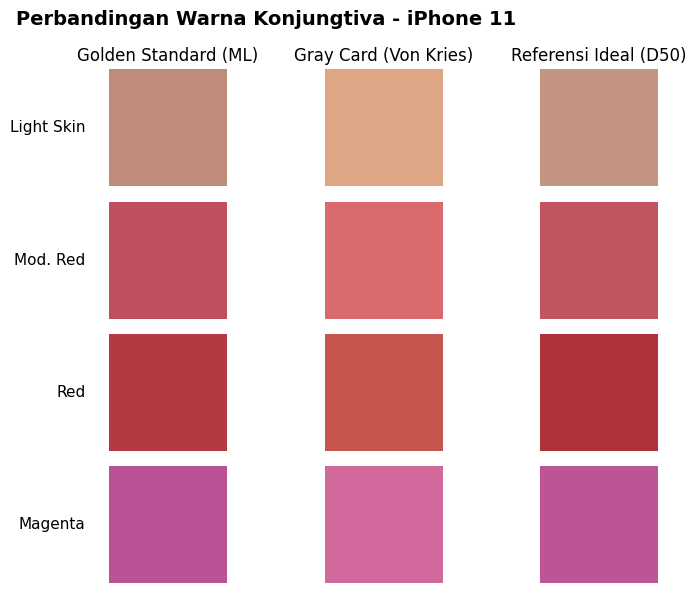


[MENAMPILKAN VISUALISASI GAMBAR KESELURUHAN...]


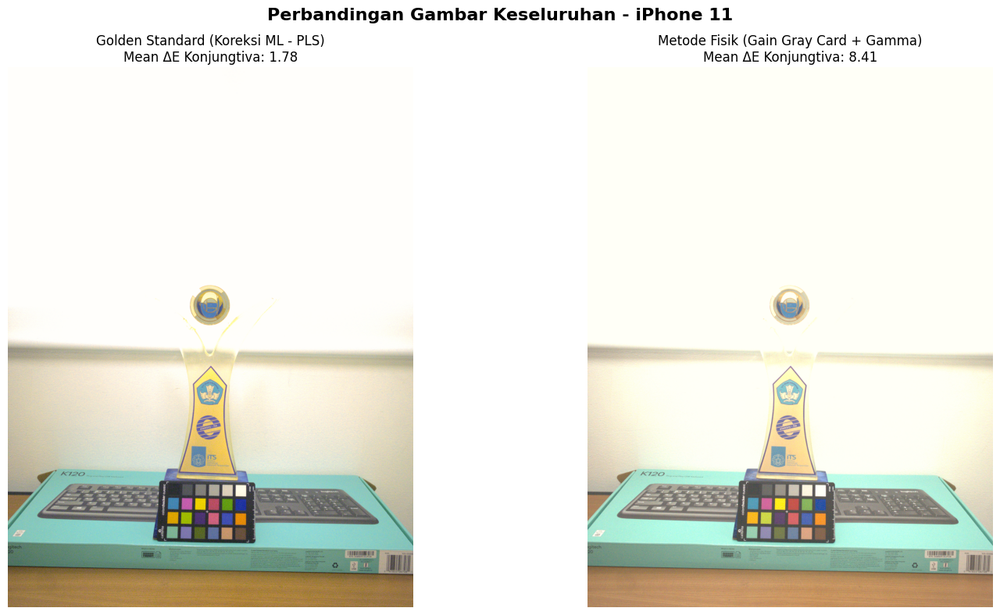

In [230]:
# Format Koordinat: (y_start, y_end, x_start, x_end)
roi_2 = (3400, 3500, 1500, 1600)

# Jalankan Fungsi
patch_ml_2, patch_gray_2 = evaluasi_komparatif_hp(
    path_cc_2, 
    path_gray_2, 
    roi_2, 
    "iPhone 11"
)

## COLOR CORRECTION FIX?

### Library Uses

In [2]:
import numpy as np
import cv2
import rawpy
import sys
import os
import pickle
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures

jalur_utama = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA'
if jalur_utama not in sys.path:
    sys.path.append(jalur_utama)

from scripts.reference_values import referenceColor
from scripts.ColorCorrectionML import ColorCorrectionML

In [3]:
INDEKS_KONJUNGTIVA = [1, 8, 14, 16] 
NAMA_PATCH = ["Light Skin", "Mod. Red", "Red", "Magenta"]

In [4]:
path_cc = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\CC 5 iPhone.dng'

with rawpy.imread(path_cc) as raw:
    rgb_cc = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

bgr_cc = cv2.cvtColor(rgb_cc, cv2.COLOR_RGB2BGR)

cc_ml = ColorCorrectionML(bgr_cc, chart='Classic', illuminant='D50')
src_awal, _, _ = cc_ml.extract_color_chart()

# Latih Model Regresi PLS
print("Melatih model PLS...")
degree = 3

model_pls, _ = cc_ml.compute_correction(
    show=False, 
    method='pls', 
    degree=degree, 
    interactions_only=False, 
    ncomp=10
)

poly = PolynomialFeatures(degree=degree, interaction_only=False)

src_transformed = poly.fit_transform(src_awal)
src_akhir = np.clip(model_pls.predict(src_transformed), 0, 255)

patch_sebelum = src_awal[INDEKS_KONJUNGTIVA]
patch_sesudah = src_akhir[INDEKS_KONJUNGTIVA]
patch_referensi = cc_ml.reference[INDEKS_KONJUNGTIVA]

dE_all_sesudah = ColorCorrectionML.DeltaE(src_akhir, cc_ml.reference)[2]
dE_konj_sesudah = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Final Mean Delta E (24 Patch Keseluruhan) : {dE_all_sesudah:.4f}")
print(f"Final Mean Delta E (4 Patch Konjungtiva)  : {dE_konj_sesudah:.4f}")
print("Model Training Finished")

Melatih model PLS...
Initial mean DeltaE:  5.18323690811
Number of components:  10
Final Mean Delta E (24 Patch Keseluruhan) : 2.1659
Final Mean Delta E (4 Patch Konjungtiva)  : 1.8786
Model Training Finished


### Evaluasi Numerik

In [5]:
dE_sebelum = ColorCorrectionML.DeltaE(patch_sebelum, patch_referensi)[2]
dE_sesudah = ColorCorrectionML.DeltaE(patch_sesudah, patch_referensi)[2]

print(f"Mean Delta E (Sebelum Koreksi) : {dE_sebelum:.4f}")
print(f"Mean Delta E (Sesudah Koreksi) : {dE_sesudah:.4f}\n")

print(f"{'Nama Patch':<12} | {'Referensi Ideal':<16} | {'Sebelum (Kamera)':<16} | {'Sesudah (ML)':<16} | {'Selisih (Ref - ML)':<18}")
print("-" * 85)

for i in range(len(INDEKS_KONJUNGTIVA)):
    nama = NAMA_PATCH[i]
    ref = np.round(patch_referensi[i]).astype(int)
    seb = np.round(patch_sebelum[i]).astype(int)
    ses = np.round(patch_sesudah[i]).astype(int)
    diff = np.abs(ref - ses)
    
    ref_str = f"[{ref[0]:>3}, {ref[1]:>3}, {ref[2]:>3}]"
    seb_str = f"[{seb[0]:>3}, {seb[1]:>3}, {seb[2]:>3}]"
    ses_str = f"[{ses[0]:>3}, {ses[1]:>3}, {ses[2]:>3}]"
    diff_str = f"[{diff[0]:>3}, {diff[1]:>3}, {diff[2]:>3}]"
    print(f"{nama:<12} | {ref_str:<16} | {seb_str:<16} | {ses_str:<16} | {diff_str:<18}")

Mean Delta E (Sebelum Koreksi) : 2.5326
Mean Delta E (Sesudah Koreksi) : 1.8786

Nama Patch   | Referensi Ideal  | Sebelum (Kamera) | Sesudah (ML)     | Selisih (Ref - ML)
-------------------------------------------------------------------------------------
Light Skin   | [195, 149, 128]  | [183, 139, 122]  | [187, 140, 120]  | [  8,   9,   8]   
Mod. Red     | [194,  84,  97]  | [197,  84,  99]  | [189,  83,  99]  | [  5,   1,   2]   
Red          | [175,  50,  57]  | [172,  59,  57]  | [179,  60,  64]  | [  4,  10,   7]   
Magenta      | [188,  84, 150]  | [183,  85, 163]  | [190,  82, 147]  | [  2,   2,   3]   


### Visualisasi Perbandingan Patch dan Hasil Keseluruhan Color Correction

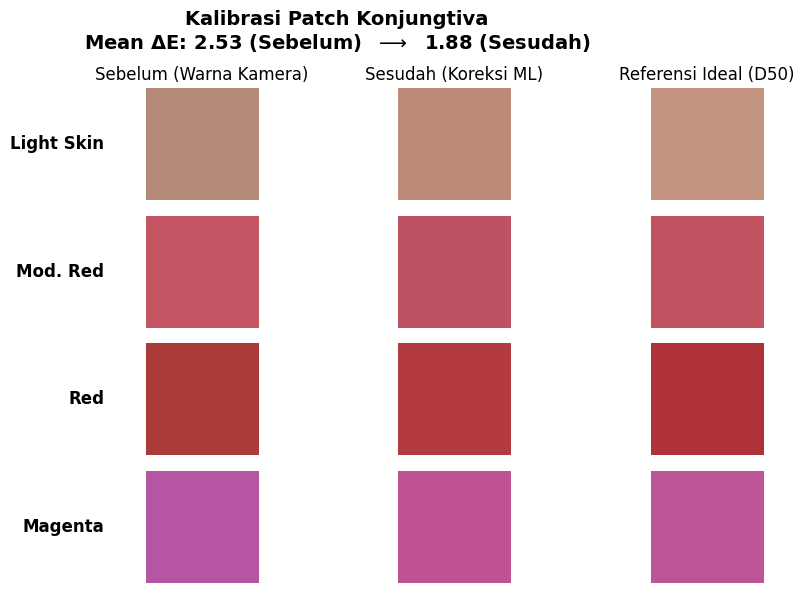

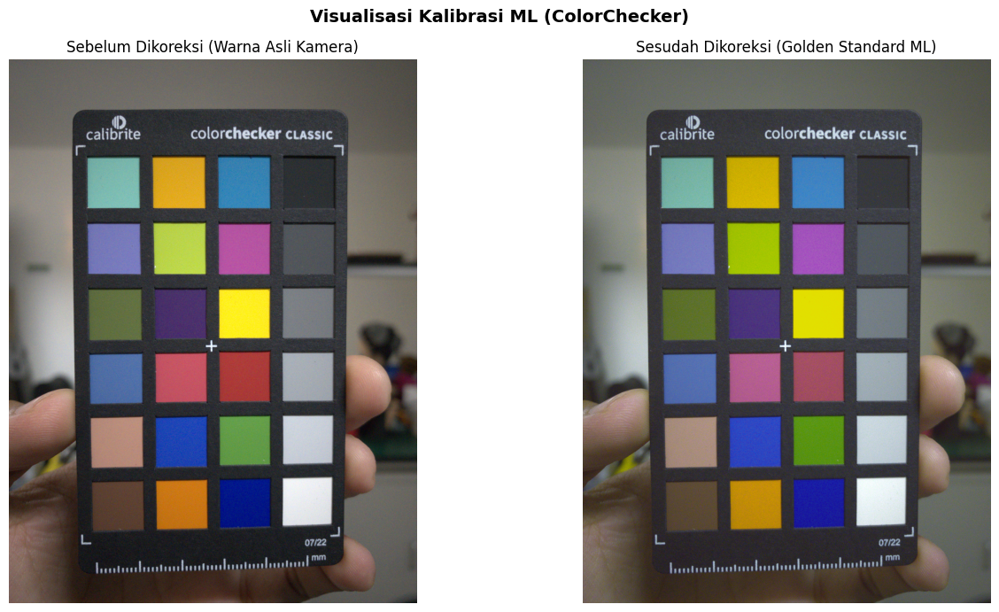

In [6]:
# =================================================================
# VISUALISASI PATCH KONJUNGTIVA (VERSI RAPI)
# =================================================================
fig_patch, axes_patch = plt.subplots(len(INDEKS_KONJUNGTIVA), 3, figsize=(10, 6))
fig_patch.suptitle(f"Kalibrasi Patch Konjungtiva\nMean \u0394E: {dE_sebelum:.2f} (Sebelum)  $\longrightarrow$  {dE_sesudah:.2f} (Sesudah)", fontsize=14, fontweight='bold')

axes_patch[0, 0].set_title("Sebelum (Warna Kamera)")
axes_patch[0, 1].set_title("Sesudah (Koreksi ML)")
axes_patch[0, 2].set_title("Referensi Ideal (D50)")

for i in range(len(INDEKS_KONJUNGTIVA)):
    c_seb = np.clip(patch_sebelum[i] / 255.0, 0, 1)
    c_ses = np.clip(patch_sesudah[i] / 255.0, 0, 1)
    c_ref = np.clip(patch_referensi[i] / 255.0, 0, 1)

    # -----------------------------------------------------
    # KOLOM 1: SEBELUM (Dengan Label Nama Patch)
    # -----------------------------------------------------
    axes_patch[i, 0].imshow([[c_seb]])
    # Matikan angka koordinat (ticks) agar bersih
    axes_patch[i, 0].set_xticks([])
    axes_patch[i, 0].set_yticks([])
    # Hilangkan garis tepi (spines) agar terlihat seperti axis('off')
    for spine in axes_patch[i, 0].spines.values():
        spine.set_visible(False)
    # Gunakan ylabel untuk nama patch agar marginnya otomatis dan rapi
    axes_patch[i, 0].set_ylabel(NAMA_PATCH[i], rotation=0, labelpad=30, va='center', ha='right', fontsize=12, fontweight='bold')

    # -----------------------------------------------------
    # KOLOM 2: SESUDAH
    # -----------------------------------------------------
    axes_patch[i, 1].imshow([[c_ses]])
    axes_patch[i, 1].axis('off')

    # -----------------------------------------------------
    # KOLOM 3: REFERENSI D50
    # -----------------------------------------------------
    axes_patch[i, 2].imshow([[c_ref]])
    axes_patch[i, 2].axis('off')

# Optimasi margin agar label di sebelah kiri tidak terpotong
plt.tight_layout()
plt.subplots_adjust(left=0.25, top=0.85, wspace=0.1) 
plt.show()

# =================================================================
# VISUALISASI GAMBAR KESELURUHAN
# =================================================================
bgr_cc_corrected = cc_ml.correct_img(bgr_cc, show=False)
rgb_cc_corrected = cv2.cvtColor(bgr_cc_corrected, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle("Visualisasi Kalibrasi ML (ColorChecker)", fontsize=14, fontweight='bold')

axes[0].imshow(cv2.cvtColor(bgr_cc, cv2.COLOR_BGR2RGB))
axes[0].set_title("Sebelum Dikoreksi (Warna Asli Kamera)")
axes[0].axis('off')

axes[1].imshow(rgb_cc_corrected)
axes[1].set_title("Sesudah Dikoreksi (Golden Standard ML)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

### Save Weight Model

In [7]:
folder_tujuan = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\iPhone 11'
os.makedirs(folder_tujuan, exist_ok=True)
nama_file_model = os.path.join(folder_tujuan, 'weight_1.pkl')

with open(nama_file_model, 'wb') as f:
    pickle.dump({'model': model_pls, 'poly': poly}, f)

print(f"Weight ML telah disimpan di dalam folder:\n{folder_tujuan}")

Weight ML telah disimpan di dalam folder:
C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\iPhone 11


### Color Correction to New Image

In [8]:
import numpy as np
import cv2
import rawpy
import pickle
import matplotlib.pyplot as plt
import os
from sklearn.preprocessing import PolynomialFeatures

### Read Weight & Define Path Original Image

In [9]:
path_img = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\dataset\Dataset Preliminary\buat cc\Validasi CC 5 iPhone.dng'

folder_tujuan = r'C:\Folder Dzakwan\Folder Dzakwan\Keperluan TA\models\weights\Color Correction\iPhone 11'
nama_file_model = os.path.join(folder_tujuan, 'weight_1.pkl')

with open(nama_file_model, 'rb') as f:
    data_kalibrasi = pickle.load(f)

model_pls = data_kalibrasi['model']
poly = data_kalibrasi['poly']

print("Weight Model berhasil dimuat")

Weight Model berhasil dimuat


### Chunking - Color Correction

In [10]:
with rawpy.imread(path_img) as raw:
    # Parameter exp_shift ini WAJIB sama dengan saat di Sel 1 (1.0)
    rgb_pasien = raw.postprocess(use_camera_wb=True, exp_shift=1.0)

bgr_pasien = cv2.cvtColor(rgb_pasien, cv2.COLOR_RGB2BGR)

h, w, c = bgr_pasien.shape
bgr_flat = bgr_pasien.reshape(-1, 3)

# Mengakali NotFittedError dengan memberikan dummy 1 piksel
poly.fit(bgr_flat[:1])

# Menggunakan wadah float32 untuk mencegah Integer Overflow
bgr_corrected_flat = np.zeros_like(bgr_flat, dtype=np.float32)
chunk_size = 1_000_000 

for i in range(0, len(bgr_flat), chunk_size):
    # Ubah potongan ke float32 sebelum masuk ke fungsi ML
    chunk = bgr_flat[i:i+chunk_size].astype(np.float32)
    
    chunk_poly = poly.transform(chunk)
    bgr_corrected_flat[i:i+chunk_size] = model_pls.predict(chunk_poly)

# Kembalikan ke format gambar normal dengan batas 0-255
bgr_corrected = np.clip(bgr_corrected_flat, 0, 255).astype(np.uint8).reshape(h, w, c)
rgb_corrected = cv2.cvtColor(bgr_corrected, cv2.COLOR_BGR2RGB)
print("Color Correction selesai!")

Color Correction selesai!


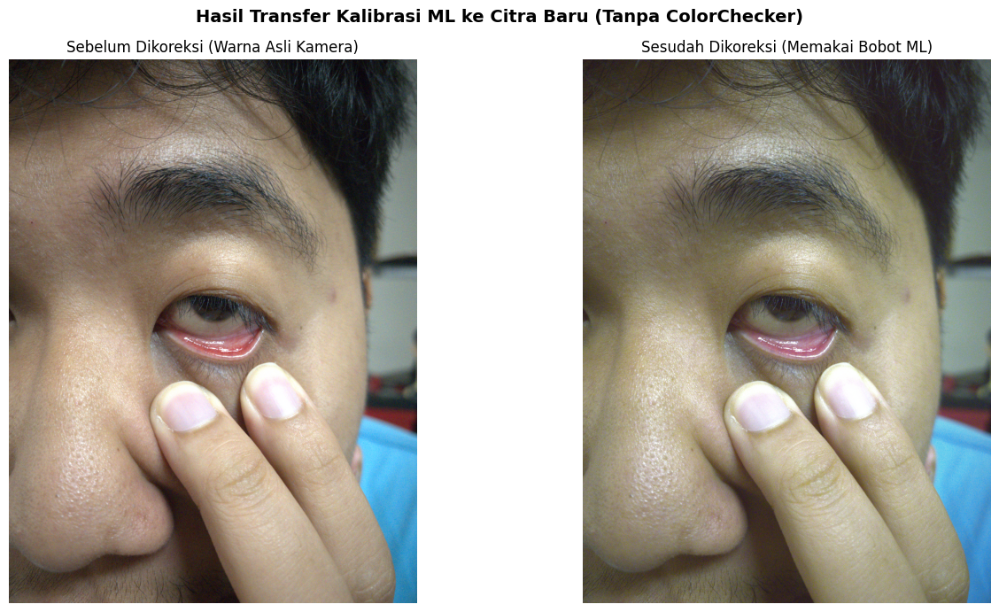

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle("Hasil Transfer Kalibrasi ML ke Citra Baru (Tanpa ColorChecker)", fontsize=14, fontweight='bold')

axes[0].imshow(rgb_pasien)
axes[0].set_title("Sebelum Dikoreksi (Warna Asli Kamera)")
axes[0].axis('off')

axes[1].imshow(rgb_corrected)
axes[1].set_title("Sesudah Dikoreksi (Memakai Bobot ML)")
axes[1].axis('off')

plt.tight_layout()
plt.show()